In [20]:
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
import sys
sys.path.append('./')
from simul_utils import k_p, lineshape

In [21]:
data_folder = '../data/2020-06-12_clockrun2/'
f_names = os.listdir(data_folder)
data = {}
for name in f_names:
    if ('comb' in name) or ('driftcomp' in name):
        col_names = ['MJD', 'value']
    else:
        col_names = ['MJD', 'servo_idx', 'value']
    key = name.partition('.')[0]
    data[key] = pd.read_csv(data_folder + name, sep=' ', header=None, names=col_names)

### Center from C1s 

1286.7405673383284


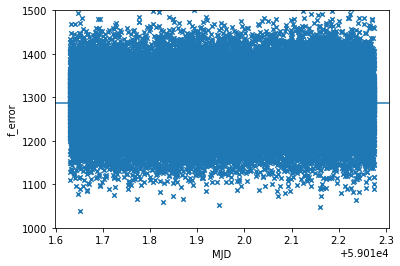

In [104]:
test = data['comb_fbeat_sdr_ch1'].copy()
test = test.rename(columns={'value': 'f_beat'})
merged = pd.merge(test, data['f_plus_C1'][['MJD', 'value']].rename(columns={'value': 'f_C1+'}), on='MJD', how='outer')
mask_p = (merged['MJD'] >= np.min(data['f_plus_C1']['MJD']))&(merged['MJD'] <= np.max(data['f_plus_C1']['MJD']))
merged = merged[mask_p]
merged = pd.merge(merged, data['f_minus_C1'][['MJD', 'value']].rename(columns={'value': 'f_C1-'}), on='MJD', how='outer')
mask_m = (merged['MJD'] >= np.min(data['f_minus_C1']['MJD']))&(merged['MJD'] <= np.max(data['f_minus_C1']['MJD']))
merged = merged[mask_m]
interpolated = merged.set_index('MJD').sort_index().interpolate('index').dropna()
n_beat = 2223894
interpolated['f_opt_C1+'] = interpolated['f_opt_C1-'] = interpolated['f_beat'].apply(lambda f: -20e6 + n_beat*100e6 - f)
interpolated['f_opt_C1+'] = interpolated['f_opt_C1-'] = interpolated['f_opt_C1+'] * 2. + 178.5e6
interpolated['f_opt_C1+'] += (interpolated['f_C1+'] * 2e6)
interpolated['f_opt_C1-'] += (interpolated['f_C1-'] * 2e6)
interpolated['f_opt_C1-'] = interpolated['f_opt_C1-']
interpolated['f_center'] = (interpolated['f_opt_C1+'] + interpolated['f_opt_C1-']) / 2.
interpolated['f_error'] =  interpolated['f_center'] -  444779044095486
interpolated.reset_index().plot.scatter(x='MJD', y='f_error', marker='x')
plt.ylim([1e3, 1.5e3])
plt.axhline(np.mean(interpolated['f_error']))
print(np.mean(interpolated['f_error']))

### Center from C2s

1286.152476993865


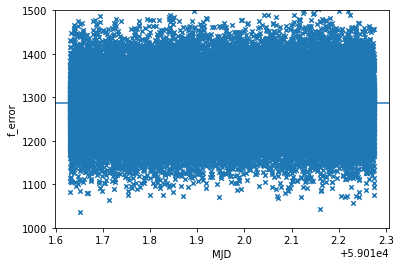

In [105]:
test = data['comb_fbeat_sdr_ch1'].copy()
test = test.rename(columns={'value': 'f_beat'})
merged = pd.merge(test, data['f_plus_C2'][['MJD', 'value']].rename(columns={'value': 'f_C2+'}), on='MJD', how='outer')
mask_p = (merged['MJD'] >= np.min(data['f_plus_C2']['MJD']))&(merged['MJD'] <= np.max(data['f_plus_C2']['MJD']))
merged = merged[mask_p]
merged = pd.merge(merged, data['f_minus_C2'][['MJD', 'value']].rename(columns={'value': 'f_C2-'}), on='MJD', how='outer')
mask_m = (merged['MJD'] >= np.min(data['f_minus_C1']['MJD']))&(merged['MJD'] <= np.max(data['f_minus_C2']['MJD']))
merged = merged[mask_m]
interpolated = merged.set_index('MJD').sort_index().interpolate('index').dropna()
n_beat = 2223894
interpolated['f_opt_C2+'] = interpolated['f_opt_C2-'] = interpolated['f_beat'].apply(lambda f: -20e6 + n_beat*100e6 - f)
interpolated['f_opt_C2+'] = interpolated['f_opt_C2-'] = interpolated['f_opt_C2+'] * 2. + 178.5e6
interpolated['f_opt_C2+'] += (interpolated['f_C2+'] * 2e6)
interpolated['f_opt_C2-'] += (interpolated['f_C2-'] * 2e6)
interpolated['f_opt_C2-'] = interpolated['f_opt_C2-']
interpolated['f_center'] = (interpolated['f_opt_C2+'] + interpolated['f_opt_C2-']) / 2.
interpolated['f_error'] =  interpolated['f_center'] -  444779044095486
interpolated.reset_index().plot.scatter(x='MJD', y='f_error', marker='x')
plt.ylim([1e3, 1.5e3])
plt.axhline(np.mean(interpolated['f_error']))
print(np.mean(interpolated['f_error']))

### Verify gain setting

Theoretical optimal gain: 65.83795385480484


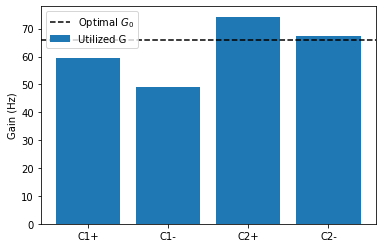

In [106]:
match_names = {'C1+': ['f_plus_C1', 'counts_blu_C1plus', 'counts_red_C1plus'],
               'C1-': ['f_minus_C1', 'counts_blu_C1minus', 'counts_red_C1minus'],
               'C2+': ['f_plus_C2', 'counts_blu_C2plus', 'counts_red_C2plus'],
               'C2-': ['f_minus_C2', 'counts_blu_C2minus', 'counts_red_C2minus']}
gs = {}
g = lambda row: row['f_diff'] * (( row['n_R'] + row['n_B'] )/(row['n_B'] - row['n_R']))
for key, (freqs, blus, reds) in match_names.items():
    m0 = pd.merge(data[freqs][['MJD', 'value']].rename(columns={'value': 'f0'}), data[blus][['MJD', 'value']].rename(columns={'value': 'n_B'}), on='MJD')
    m0 = pd.merge(m0, data[reds][['MJD', 'value']].rename(columns={'value': 'n_R'}), on='MJD')
    m0[['n_R', 'n_B']] = m0[['n_R', 'n_B']] / 100.
    m0['f0'] *= 2e6
    m0['f_diff'] = 0.
    m0['f_diff'][1:] = np.diff(m0['f0'])
    m0['g'] = m0[1:].apply(g, axis=1)
    gs[key] = np.mean(m0['g'][1:])

# ideal k_p
d = np.linspace(-200, 200, 1000)
l_s = lineshape(d, 4e-3, False)
kp, _, _ = k_p(l_s, d, 4e-3)
p_X = 0.25
g0 = -2 * p_X / kp # gain
print(f"Theoretical optimal gain: {g0}")
plt.bar(range(len(gs)), list(gs.values()), align='center', label='Utilized G')
plt.xticks(range(len(gs)), list(gs.keys()))
plt.axhline(g0, linestyle='--', color='k', label=r'Optimal $G_0$')
plt.ylabel('Gain (Hz)')
plt.legend()

71907


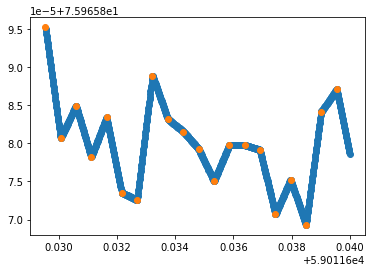

In [107]:
# test interpolation
test = data['comb_fbeat_sdr_ch1'].copy()
test = test.rename(columns={'value': 'f_beat'})
merged = pd.merge(test, data['f_plus_C1'][['MJD', 'value']].rename(columns={'value': 'f_C1+'}), on='MJD', how='outer')
print(merged['f_C1+'].isna().sum())
mask_p = (merged['MJD'] >= np.min(data['f_plus_C1']['MJD']))&(merged['MJD'] <= np.max(data['f_plus_C1']['MJD']))
merged = merged[mask_p]
interpolated = merged.set_index('MJD').sort_index().interpolate('index').dropna()
orig = data['f_plus_C1'][['MJD', 'value']].rename(columns={'value': 'f_C1+'})
int_to_plot = interpolated.reset_index()[['MJD', 'f_C1+']].loc[interpolated.reset_index()['MJD'] < 59011.64]
plt.scatter(int_to_plot['MJD'], int_to_plot['f_C1+'])
orig_to_plot = orig[['MJD', 'f_C1+']].loc[orig['MJD'] < 59011.64]
plt.scatter(orig_to_plot['MJD'], orig_to_plot['f_C1+'])